In [10]:
import numpy as np
import skimage
print(skimage.__version__)
import sklearn as skl
import matplotlib.pyplot as plt
from skimage import data, io, exposure, filters, util
from skimage.color import rgb2gray
from skimage.transform import resize
import cv2
import math
import os
from os import listdir
from os.path import isfile, join
import pandas as pd

print()


0.21.0



In [11]:
ROOT_PATH = '/home/terminus/Desktop/TCV1/Glomerulus/'
NORMAL_TREINO = 'Normal/treino/'
OUTPUT = 'OUTPUT/'
PICRO = 'PICRO/'
AZAN = 'AZAN/'
PAMS = 'PAMS/'
PAS = 'PAS/'
HE = 'HE/'

#OUTPUT_DICT = {}


NORMAL_TREINO_PATH = ROOT_PATH + NORMAL_TREINO
OUTPUT_PATH = ROOT_PATH + OUTPUT

AZAN_NORMAL_PATH = NORMAL_TREINO_PATH + AZAN
HE_NORMAL_PATH = NORMAL_TREINO_PATH + HE
PAMS_NORMAL_PATH = NORMAL_TREINO_PATH + PAMS
PAS_NORMAL_PATH = NORMAL_TREINO_PATH + PAS
PICRO_NORMAL_PATH = NORMAL_TREINO_PATH + PICRO

AZAN_OUTPUT_PATH = OUTPUT_PATH + AZAN
HE_OUTPUT_PATH = OUTPUT_PATH + HE
PAMS_OUTPUT_PATH = OUTPUT_PATH + PAMS
PAS_OUTPUT_PATH = OUTPUT_PATH + PAS
PICRO_OUTPUT_PATH = OUTPUT_PATH + PICRO

paths_normal = [
AZAN_NORMAL_PATH,
HE_NORMAL_PATH,
PAMS_NORMAL_PATH,
PAS_NORMAL_PATH,
PICRO_NORMAL_PATH,
]

paths_output = [
AZAN_OUTPUT_PATH,
HE_OUTPUT_PATH,
PAMS_OUTPUT_PATH,
PAS_OUTPUT_PATH,
PICRO_OUTPUT_PATH,
]

images = []
images_resized = []
images_resized_gray = []
img_files = []
img_equals = []
img_gamma = []
img_gauss = []
img_laplace = []
img_names = ['/content/drive/MyDrive/glomerulos/train/normal/113IP71229AAE.jpg',
             '/content/drive/MyDrive/glomerulos/train/normal/2004PC0160AJ.jpg',
             '/content/drive/MyDrive/glomerulos/train/normal/NOR2005PS1735ac.jpg']

def get_files(path):
  files = [f for f in listdir(path) if isfile(join(path, f))]
  return files

#imax = 1
#tam = 3

def get_file_i(path, i):
  files = get_files(path)
  n = len(files)
  if n == 0:
    return None
  elif n <= i:
    return path + get_files(path)[n-1]
  elif i < 0:
    path + get_files(path)[0]
  return path + get_files(path)[i]

for path in paths_normal:
  print(path)
  if not os.path.exists(path):
    print("not exist")
    os.makedirs(path)
  else:
    print("exist")
    print(get_files(path))

/home/terminus/Desktop/TCV1/Glomerulus/Normal/treino/AZAN/
exist
['treino_azan (3).JPG', 'treino_azan (8).jpg', 'treino_azan (29).jpg', 'treino_azan (63).jpg', 'treino_azan (10).jpg', 'treino_azan (27).jpg', 'treino_azan (57).jpg', 'treino_azan (45).jpg', 'treino_azan (48).jpg', 'treino_azan (11).jpg', 'treino_azan (46).jpg', 'treino_azan (7).jpg', 'treino_azan (21).jpg', 'treino_azan (37).jpg', 'treino_azan (9).jpg', 'treino_azan (20).jpg', 'treino_azan (42).jpg', 'treino_azan (4).JPG', 'treino_azan (36).jpg', 'treino_azan (33).jpg', 'treino_azan (6).JPG', 'treino_azan (41).jpg', 'treino_azan (50).jpg', 'treino_azan (35).jpg', 'treino_azan (16).jpg', 'treino_azan (25).jpg', 'treino_azan (61).jpg', 'treino_azan (23).jpg', 'treino_azan (47).jpg', 'treino_azan (49).jpg', 'treino_azan (17).jpg', 'treino_azan (30).jpg', 'treino_azan (12).jpg', 'treino_azan (60).jpg', 'treino_azan (24).jpg', 'treino_azan (51).jpg', 'treino_azan (58).jpg', 'treino_azan (14).jpg', 'treino_azan (56).jpg', 'tre

In [12]:
def read_image(img_name):
  return io.imread(img_name)

In [13]:
def scale(img):
    return util.img_as_ubyte(img)

In [14]:
def light_intensity(img, scalar):
    #img = scale(img)
    img = img.astype('float32')
    for i in range(3):
        img[:,:,i] *= scalar
    return img

In [15]:
def light_shift(img, scalar):
    #img = scale(img)
    img = img.astype('float32')
    for i in range(3):
        img[:,:,i] += scalar
    return img

In [16]:
def light_shift_and_intensity(img, scalar1, scalar2):
    #img = scale(img)
    img = img.astype('float32')
    img = light_intensity(img, scalar1)
    img = light_shift(img, scalar2)
    return img

In [17]:
def o1_o2(image):
    img = image.astype('float32')

    x = image

    image_red, image_green, image_blue = x[:,:,0], x[:,:,1], x[:,:,2]

    hist_r  = image_red
    hist_g  = image_green
    hist_b  = image_blue

    O1 = (hist_r-hist_g)/math.sqrt(2)
    O2 = (hist_r+hist_g-2*hist_b)/math.sqrt(6)
    #O3 = (hist_r+hist_g+hist_b)/math.sqrt(3)

    return O1, O2

In [18]:
def transformed_color(img):
    img = img.astype('float32')
    for i in range(3):
        img[:,:,i] = (img[:,:,i]- np.mean(img[:,:,i]))/np.std(img[:,:,i])
    
    """
    for i in range(3):
        img[:,:,i] = minmax_scale(img[:,:,i], (0,255))
    img = img.astype('uint8')
    """
    return img

/home/terminus/Desktop/TCV1/Glomerulus/Normal/treino/HE/treino_he (167).jpg


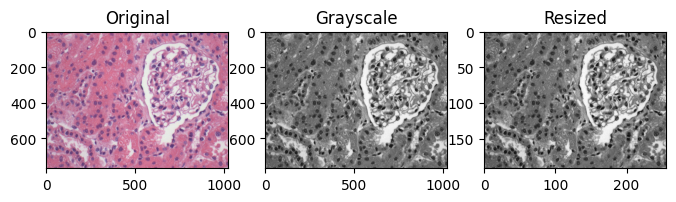

In [19]:
img_name = get_file_i(HE_NORMAL_PATH, 50)
img_file = read_image(img_name)
#io.imshow(img_file)

fig, ax = plt.subplots(1, 3, figsize=(8, 4))
ax = ax.ravel()

img_gray = rgb2gray(img_file)
image_resized = resize(img_gray, (img_gray.shape[0] // 4, img_gray.shape[1] // 4),
                       anti_aliasing=False)
ax[0].imshow(img_file)
ax[0].set_title("Original")
ax[1].imshow(img_gray, cmap='gray')
ax[1].set_title("Grayscale")
ax[2].imshow(image_resized, cmap='gray')
ax[2].set_title("Resized")

#print(img_gray.shape[0] // 4, img_gray.shape[1] // 4)
print(img_name)

In [68]:
small_ds_img = [get_file_i(AZAN_NORMAL_PATH, 10),
             get_file_i(HE_NORMAL_PATH, 2),
             get_file_i(PAS_NORMAL_PATH, 40)]

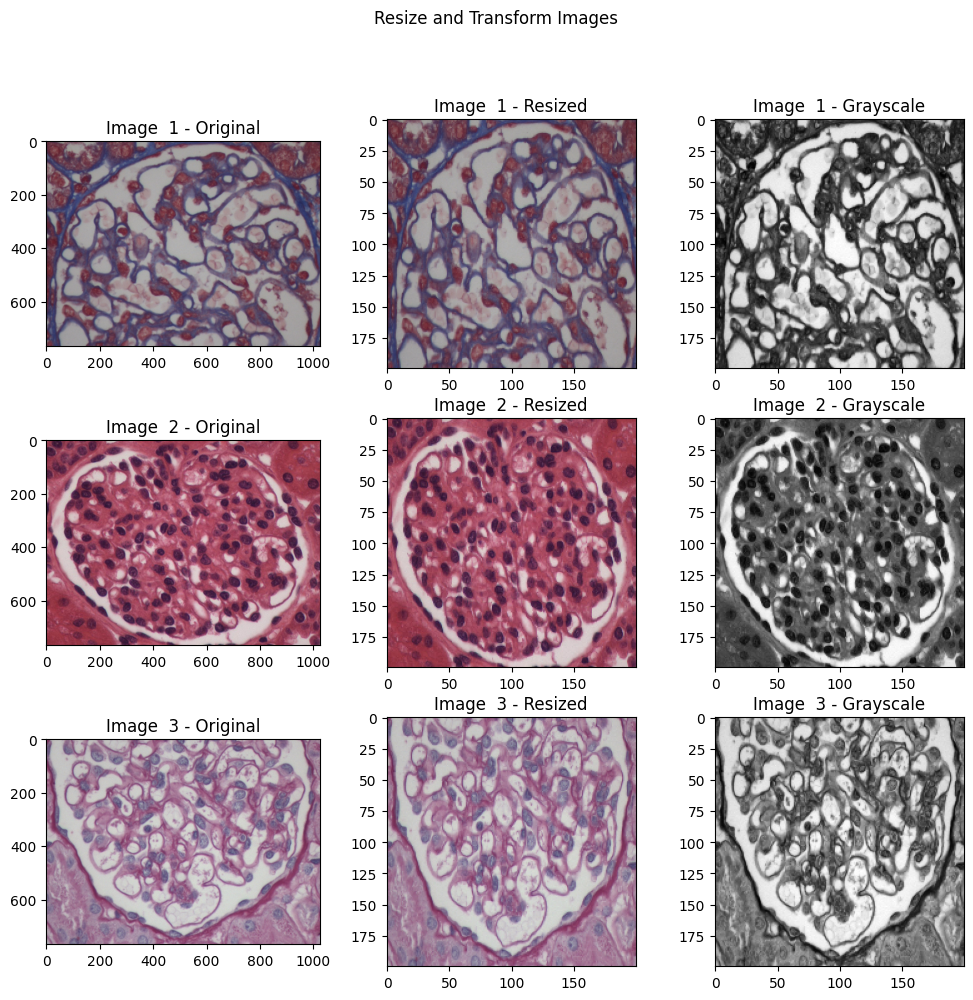

In [81]:
img_names = small_ds_img

fig, ax = plt.subplots(len(img_names), 3, figsize=(12, int(10/4*len(img_names))+4))
fig.suptitle('Resize and Transform Images')

count = 0
images_resized = []
images_resized_gray = []
for i, img_name in enumerate(img_names):
  count=3*i
  img_file = read_image(img_name)
  img = img_file.copy()
  ax[i,0].imshow(img)
  ax[i,0].set_title("Image  " + str(i+1) + " - Original")

  resized_image = resize(img, (200, 200), anti_aliasing=False)
  images_resized.append(resized_image)
  
  ax[i,1].imshow(resized_image)
  ax[i,1].set_title("Image  " + str(i+1) + " - Resized" )


  img_gray = rgb2gray(resized_image)
  images_resized_gray.append(img_gray)
  
  ax[i,2].imshow(img_gray, cmap='gray')
  ax[i,2].set_title("Image  " + str(i+1) + " - Grayscale")

  #images.append(image_resized)

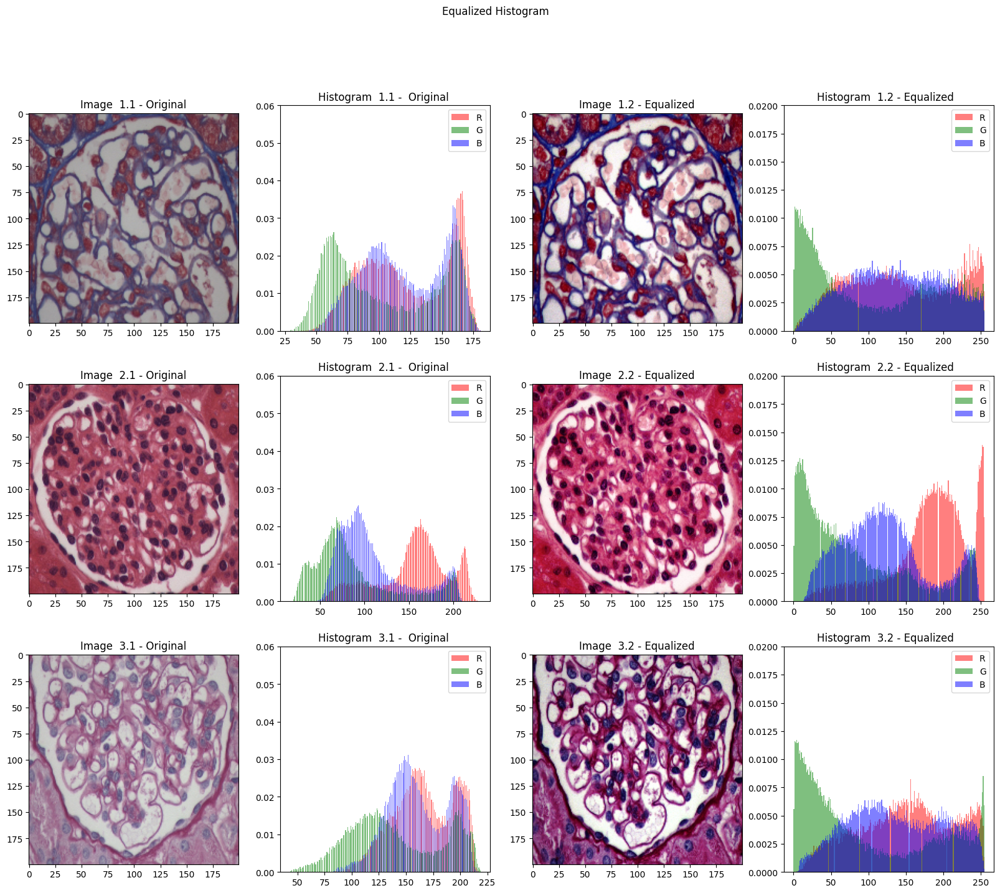

In [86]:
fig, ax = plt.subplots(len(img_names), 4, figsize=(20, 16))
fig.suptitle('Equalized Histogram')

count = 0
img_equals =[]
for i, img in enumerate(images_resized):
  x = img.copy()
  y = exposure.equalize_hist(x)
  img_equals.append(y)
  ax[i,0].imshow(x)
  ax[i,0].set_title("Image  " + str(i+1) + ".1 - Original")

  ax[i,1].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[i,1].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[i,1].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[i,1].legend()
  ax[i,1].set_ylim(0,0.06)
  ax[i,1].set_title("Histogram  " + str(i+1) + ".1 -  Original ")

  ax[i,2].imshow(y)
  ax[i,2].set_title("Image  " + str(i+1) + ".2 - Equalized")

  ax[i,3].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[i,3].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[i,3].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[i,3].legend()
  ax[i,3].set_ylim(0,0.02)
  ax[i,3].set_title("Histogram  " + str(i+1) + ".2 - Equalized  ")


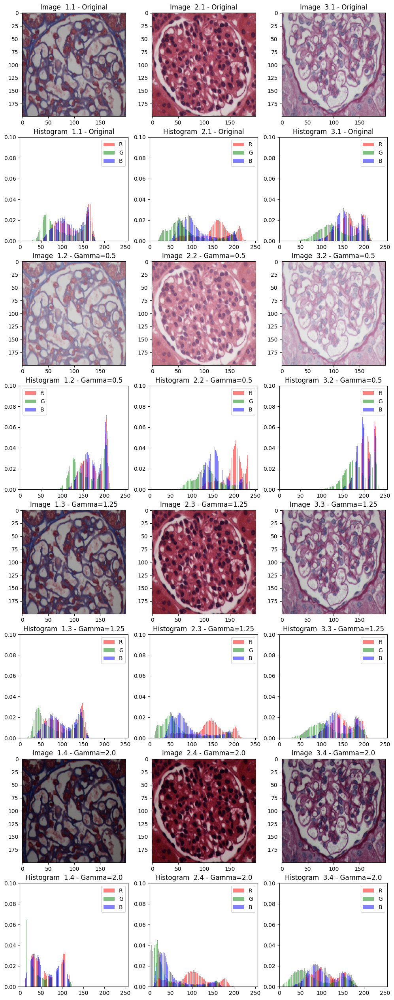

In [98]:
fig, ax = plt.subplots(8,len(img_names), figsize=(12, 32))

count = 0
max = 256
img_gamma=[]
for i, img in enumerate(images_resized):
  ax[0,i].imshow(img)
  ax[0,i].set_title("Image  " + str(i+1) + ".1 - Original")
  x = img.copy()

  ax[1,i].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[1,i].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[1,i].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[1,i].legend()
  ax[1,i].set_xlim(0,256)
  ax[1,i].set_ylim(0,0.1)
  ax[1,i].set_title("Histogram  " + str(i+1) + ".1 - Original")


  array_gamma = []

  gamma_value = 0.5
  y = exposure.adjust_gamma(x, gamma_value)
  array_gamma.append(y)
  ax[2,i].imshow(y)
  ax[2,i].set_title("Image  " + str(i+1) + ".2 - Gamma=" + str(gamma_value))

  ax[3,i].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[3,i].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[3,i].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[3,i].legend()
  ax[3,i].set_xlim(0,256)
  ax[3,i].set_ylim(0,0.1)
  ax[3,i].set_title("Histogram  " + str(i+1) + ".2 - Gamma=" + str(gamma_value))

  gamma_value = 1.25
  y = exposure.adjust_gamma(x, gamma_value)
  array_gamma.append(y)
  ax[4,i].imshow(y)
  ax[4,i].set_title("Image  " + str(i+1) + ".3 - Gamma=" + str(gamma_value))

  ax[5,i].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[5,i].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[5,i].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[5,i].legend()
  ax[5,i].set_xlim(0,256)
  ax[5,i].set_ylim(0,0.1)
  ax[5,i].set_title("Histogram  " + str(i+1) + ".3 - Gamma=" + str(gamma_value))


  gamma_value = 2.0
  y = exposure.adjust_gamma(x, gamma_value)
  array_gamma.append(y)
  ax[6,i].imshow(y)
  ax[6,i].set_title("Image  " + str(i+1) + ".4 - Gamma=" + str(gamma_value))

  ax[7,i].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[7,i].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[7,i].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[7,i].legend()
  ax[7,i].set_xlim(0,256)
  ax[7,i].set_ylim(0,0.1)
  ax[7,i].set_title("Histogram  " + str(i+1) + ".4 - Gamma=" + str(gamma_value))

  img_gamma.append(array_gamma)


/tmp/ipykernel_257857/1816939810.py:22: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.22. Set `channel_axis=-1` explicitly to silence this warning.
  y = filters.gaussian(x, gauss_value)
/tmp/ipykernel_257857/1816939810.py:36: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.22. Set `channel_axis=-1` explicitly to silence this warning.
  y = filters.gaussian(x, gauss_value)
/tmp/ipykernel_257857/1816939810.py:51: FutureWarning: Automatic detection of the color channel was deprecated in v0.19, and `channel_axis=None` will be the new default in v0.22. Set `channel_axis=-1` explicitly to silence this warning.
  y = filters.gaussian(x, gauss_value)


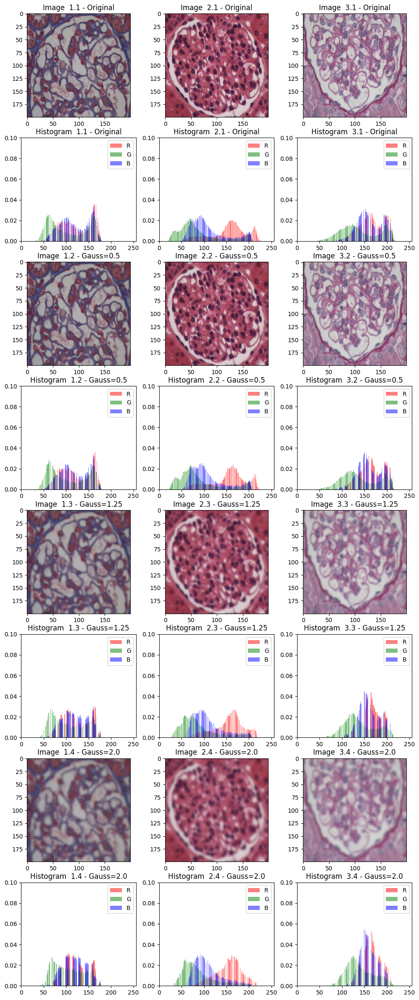

In [103]:
fig, ax = plt.subplots(8,len(img_names), figsize=(12, 30))

count = 0
img_gauss=[]
for i, img in enumerate(images_resized):
  x = img.copy()
  ax[0,i].imshow(x)
  ax[0,i].set_title("Image  " + str(i+1) + ".1 - Original")

  ax[1,i].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[1,i].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[1,i].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[1,i].legend()
  ax[1,i].set_xlim(0,256)
  ax[1,i].set_ylim(0,0.1)
  ax[1,i].set_title("Histogram  " + str(i+1) + ".1 - Original")


  array_gauss = []

  gauss_value = 0.5
  y = filters.gaussian(x, gauss_value)
  array_gauss.append(y)
  ax[2,i].imshow(y)
  ax[2,i].set_title("Image  " + str(i+1) + ".2 - Gauss=" + str(gauss_value))

  ax[3,i].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[3,i].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[3,i].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[3,i].legend()
  ax[3,i].set_xlim(0,256)
  ax[3,i].set_ylim(0,0.1)
  ax[3,i].set_title("Histogram  " + str(i+1) + ".2 - Gauss=" + str(gauss_value))

  gauss_value = 1.25
  y = filters.gaussian(x, gauss_value)
  array_gauss.append(y)
  ax[4,i].imshow(y)
  ax[4,i].set_title("Image  " + str(i+1) + ".3 - Gauss=" + str(gauss_value))

  ax[5,i].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[5,i].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[5,i].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[5,i].legend()
  ax[5,i].set_xlim(0,256)
  ax[5,i].set_ylim(0,0.1)
  ax[5,i].set_title("Histogram  " + str(i+1) + ".3 - Gauss=" + str(gauss_value))


  gauss_value = 2.0
  y = filters.gaussian(x, gauss_value)
  array_gauss.append(y)
  ax[6,i].imshow(y)
  ax[6,i].set_title("Image  " + str(i+1) + ".4 - Gauss=" + str(gauss_value))

  ax[7,i].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[7,i].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[7,i].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[7,i].legend()
  ax[7,i].set_xlim(0,256)
  ax[7,i].set_ylim(0,0.1)
  ax[7,i].set_title("Histogram  " + str(i+1) + ".4 - Gauss=" + str(gauss_value))

  img_gauss.append(array_gauss)


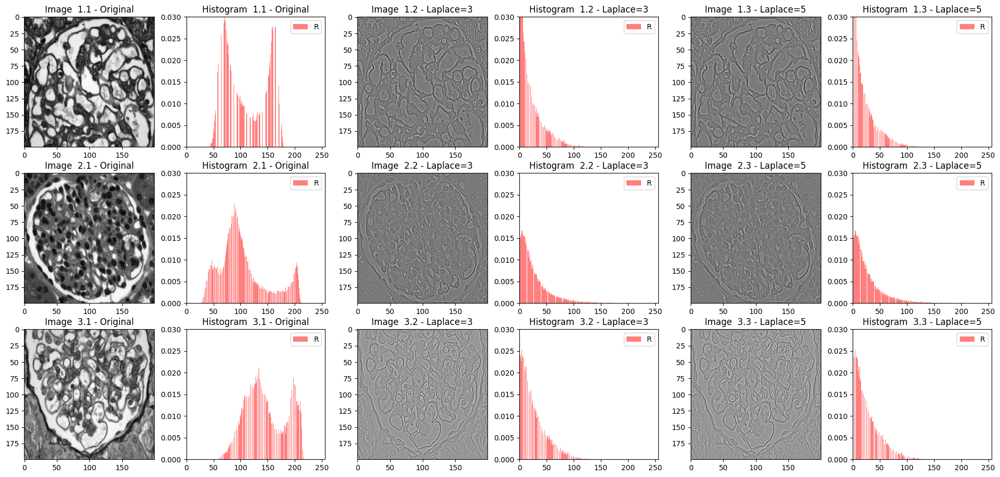

In [118]:
fig, ax = plt.subplots(len(img_names), 6, figsize=(24, 11))

count = 0
img_laplace=[]
for i, img in enumerate(images_resized):
  x = img.copy()
  x = rgb2gray(scale(x))

  ax[i,0].imshow(x, cmap="gray")
  ax[i,0].set_title("Image  " + str(i+1) + ".1 - Original")

  ax[i,1].hist(scale(x).ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[i,1].legend()
  ax[i,1].set_xlim(0,256)
  ax[i,1].set_ylim(0,0.03)
  ax[i,1].set_title("Histogram  " + str(i+1) + ".1 - Original")


  array_laplace = []

  laplace_value = 3
  y = filters.laplace(x, ksize=laplace_value)
  array_laplace.append(y)
  ax[i,2].imshow(y, cmap='gray')
  ax[i,2].set_title("Image  " + str(i+1) + ".2 - Laplace=" + str(laplace_value))

  ax[i,3].hist(scale(y.copy()).ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[i,3].legend()
  ax[i,3].set_xlim(0,256)
  ax[i,3].set_ylim(0,0.03)
  ax[i,3].set_title("Histogram  " + str(i+1) + ".2 - Laplace=" + str(laplace_value))

  laplace_value = 5
  y = filters.laplace(x, ksize=laplace_value)
  array_laplace.append(y)
  ax[i,4].imshow(y, cmap='gray')
  ax[i,4].set_title("Image  " + str(i+1) + ".3 - Laplace=" + str(laplace_value))

  ax[i,5].hist(scale(y).ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[i,5].legend()
  ax[i,5].set_xlim(0,256)
  ax[i,5].set_ylim(0,0.03)
  ax[i,5].set_title("Histogram  " + str(i+1) + ".3 - Laplace=" + str(laplace_value))


  img_laplace.append(array_laplace)


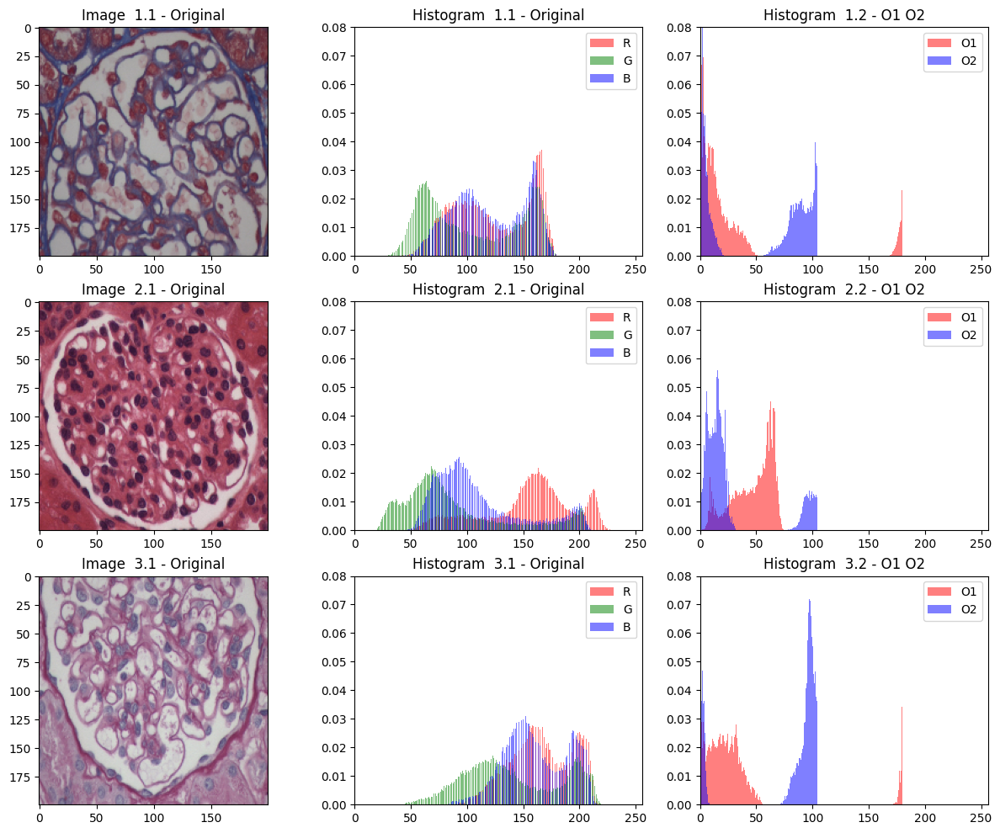

In [91]:
fig, ax = plt.subplots(len(img_names), 3, figsize=(15, 12))

for i, image in enumerate(images_resized):

  x = scale(image.copy())

  O1, O2 = o1_o2(x)

  ax[i,0].imshow(x)
  ax[i,0].set_title("Image  " + str(i+1) + ".1 - Original")

  ax[i,1].hist(scale(x)[:,:,0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
  ax[i,1].hist(scale(x)[:,:,1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
  ax[i,1].hist(scale(x)[:,:,2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
  ax[i,1].legend()
  ax[i,1].set_xlim(0,256)
  ax[i,1].set_ylim(0,0.08)
  ax[i,1].set_title("Histogram  " + str(i+1) + ".1 - Original")

  ax[i,2].hist(O1.flatten(), bins = 256, color = 'red', alpha = 0.5, density=True, label='O1')
  ax[i,2].hist(O2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
  ax[i,2].legend()
  ax[i,2].set_xlim(0,256)
  ax[i,2].set_ylim(0,0.08)
  ax[i,2].set_title("Histogram  " + str(i+1) + ".2 - O1 O2")

  '''
  ax[i,6].imshow(O3, cmap='gray')
  ax[i,6].set_title("Image  " + str(i+1) + ".2 - O3")

  ax[i,7].hist(O3.ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='O3')
  ax[i,7].legend()
  ax[i,7].set_xlim(0,256)
  #ax[i,7].set_ylim(0,0.03)
  ax[i,7].set_title("Histogram  " + str(i+1) + ".2 - O3")
  '''

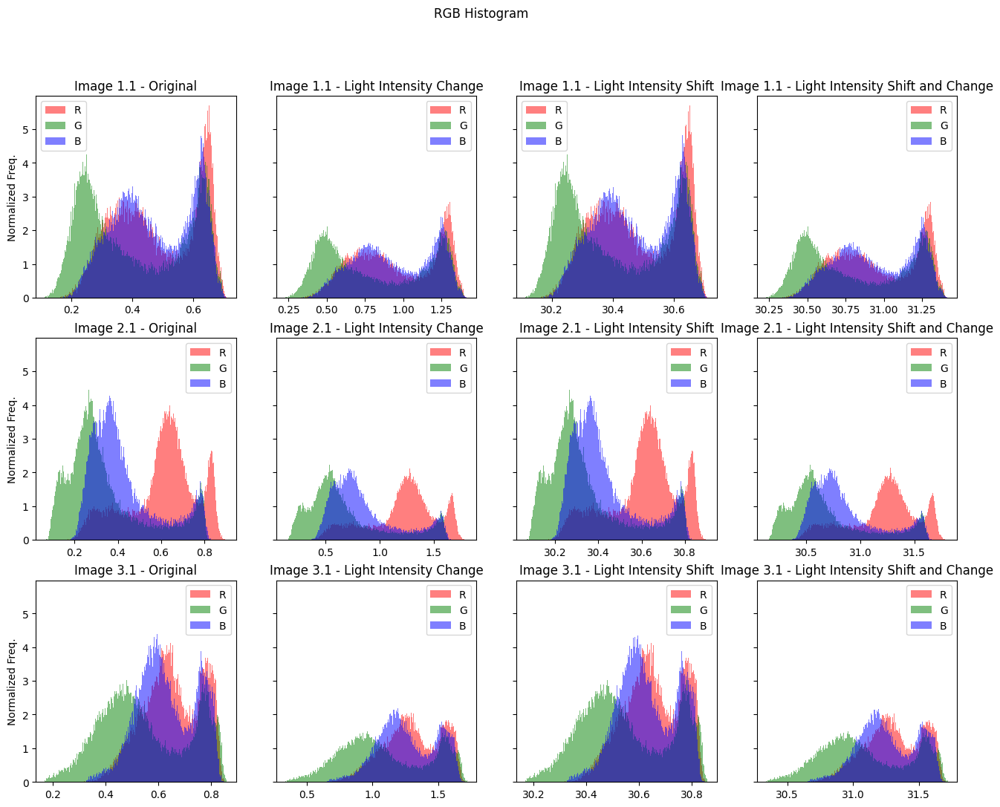

In [92]:
fig, ax = plt.subplots(3,4, sharey=True, figsize=(16,12))
fig.suptitle('RGB Histogram')
for i, image in enumerate(images_resized):

  x = image.copy()

  ax[i,0].hist(x[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,0].hist(x[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,0].hist(x[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,0].set_title("Image " + str(i+1) + ".1 - Original")
  ax[i,0].set_ylabel('Normalized Freq.')
  ax[i,0].legend()

  li = light_intensity(x,2)
  ax[i,1].hist(li[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,1].hist(li[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,1].hist(li[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,1].set_title("Image " + str(i+1) + ".1 - Light Intensity Change")
  ax[i,1].legend()

  ls = light_shift(x,30)
  ax[i,2].hist(ls[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,2].hist(ls[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,2].hist(ls[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,2].set_title("Image " + str(i+1) + ".1 - Light Intensity Shift")
  ax[i,2].legend()

  lsi = light_shift_and_intensity(x,2,30)
  ax[i,3].hist(lsi[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,3].hist(lsi[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,3].hist(lsi[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,3].set_title("Image " + str(i+1) + ".1 - Light Intensity Shift and Change")
  ax[i,3].legend()

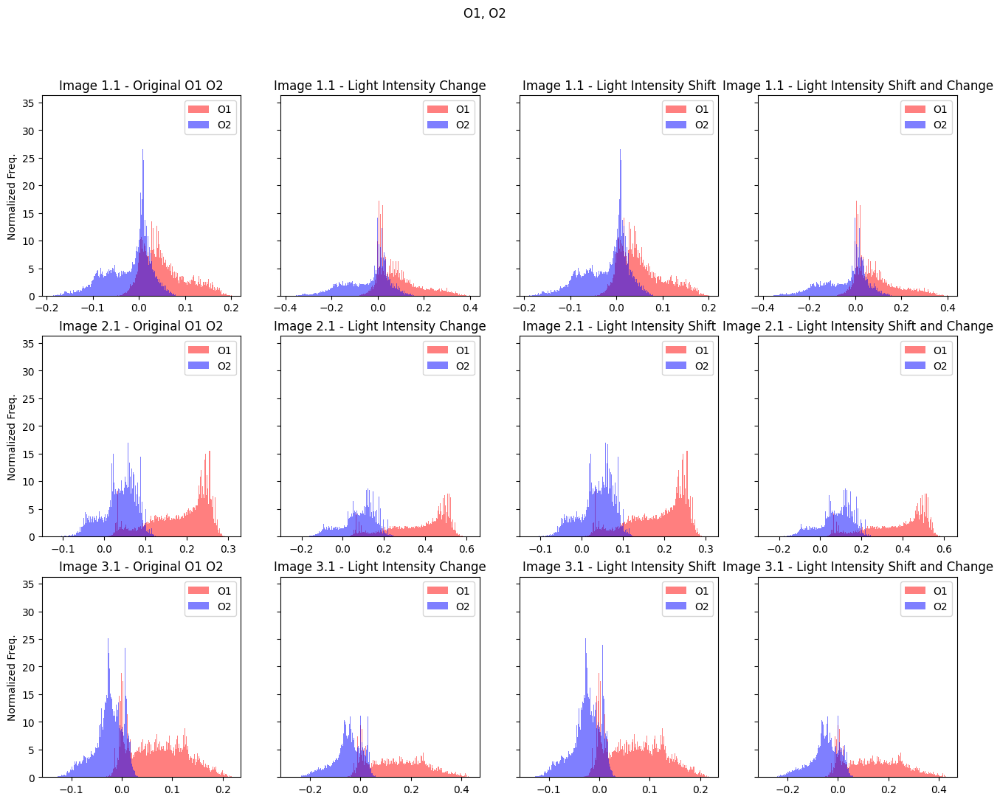

In [93]:
fig, ax = plt.subplots(3,4, sharey=True, figsize=(16,12))
fig.suptitle('O1, O2')
for i, image in enumerate(images_resized):

  x = image# scale(image.copy())
  O1, O2 = o1_o2(x)

  ax[i,0].hist(O1.flatten(), bins = 256, color = 'red', alpha = 0.5, density=True, label='O1')
  ax[i,0].hist(O2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
  ax[i,0].set_title("Image " + str(i+1) + ".1 - Original O1 O2")
  ax[i,0].set_ylabel('Normalized Freq.')
  ax[i,0].legend()

  li = light_intensity(x,2)
  O1, O2 = o1_o2(li)
  
  ax[i,1].hist(O1.flatten(), bins = 256, color = 'red', alpha = 0.5, density=True, label='O1')
  ax[i,1].hist(O2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
  ax[i,1].set_title("Image " + str(i+1) + ".1 - Light Intensity Change")
  ax[i,1].legend()

  ls = light_shift(x,30)
  O1, O2 = o1_o2(ls)

  ax[i,2].hist(O1.flatten(), bins = 256, color = 'red', alpha = 0.5, density=True, label='O1')
  ax[i,2].hist(O2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
  ax[i,2].set_title("Image " + str(i+1) + ".1 - Light Intensity Shift")
  ax[i,2].legend()

  lsi = light_shift_and_intensity(x,2,30)
  O1, O2 = o1_o2(lsi)

  ax[i,3].hist(O1.flatten(), bins = 256, color = 'red', alpha = 0.5, density=True, label='O1')
  ax[i,3].hist(O2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
  ax[i,3].set_title("Image " + str(i+1) + ".1 - Light Intensity Shift and Change")
  ax[i,3].legend()

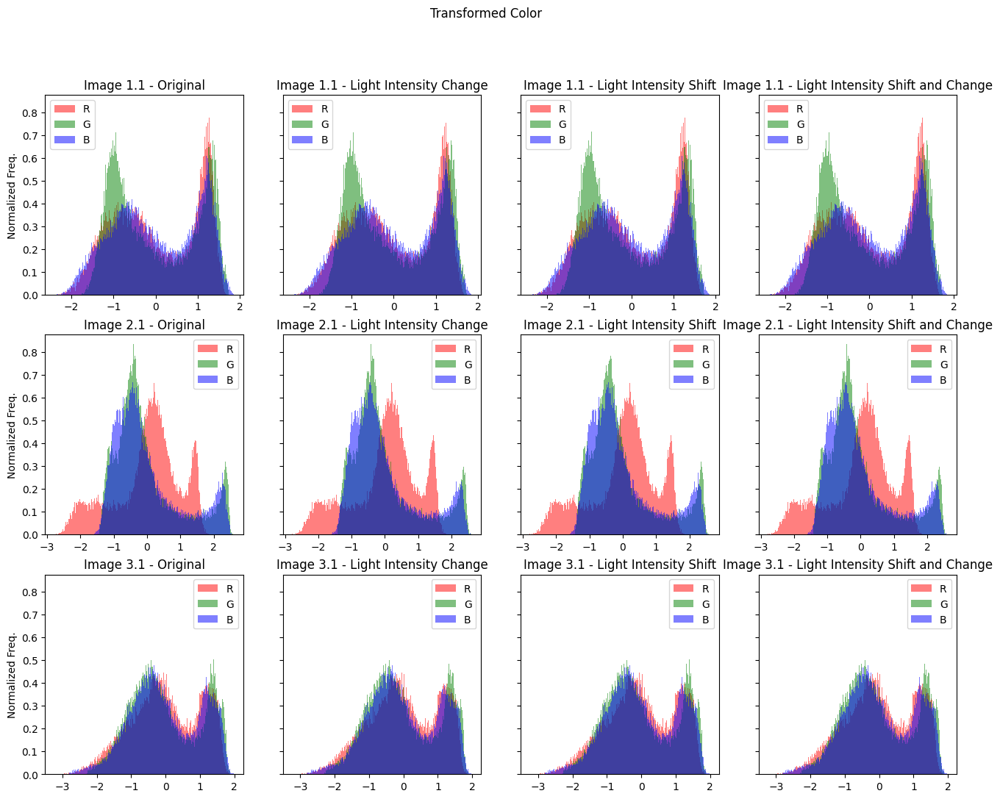

In [94]:
fig, ax = plt.subplots(3,4, sharey=True, figsize=(16,12))
fig.suptitle('Transformed Color')
for i, image in enumerate(images_resized):

  x = transformed_color(image.copy())

  ax[i,0].hist(x[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,0].hist(x[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,0].hist(x[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,0].set_title("Image " + str(i+1) + ".1 - Original")
  ax[i,0].set_ylabel('Normalized Freq.')
  ax[i,0].legend()

  li = light_intensity(x,2)
  lit = transformed_color(li)
  ax[i,1].hist(lit[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,1].hist(lit[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,1].hist(lit[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,1].set_title("Image " + str(i+1) + ".1 - Light Intensity Change")
  ax[i,1].legend()

  ls = light_shift(x,30)
  lst = transformed_color(ls)
  ax[i,2].hist(lst[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,2].hist(lst[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,2].hist(lst[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,2].set_title("Image " + str(i+1) + ".1 - Light Intensity Shift")
  ax[i,2].legend()

  lsi = light_shift_and_intensity(x,2,30)
  lsit = transformed_color(lsi)
  ax[i,3].hist(lsit[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
  ax[i,3].hist(lsit[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
  ax[i,3].hist(lsit[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
  ax[i,3].set_title("Image " + str(i+1) + ".1 - Light Intensity Shift and Change")
  ax[i,3].legend()